# Finding Hamiltonian Paths - 1QBit

In [ ]:
'''
Problem: To construct a graph and determine as many hamiltonian paths as possible between fixed start and end vertices

!!TO SKIP AHEAD TO THE FINAL SOLUTION, PLEASE HEAD STRAIGHT TO EXPERIMENT #5!!

Experiment 1: Constructing a basic undirected 1 degree graph with 100 vertices to 
                1. break down and understand the problem.
                2. determine the hamiltonian path and understand how to scale up the solution.
                
Conclusion 1: Need naming convention, graph builder (more than 1 degree vertices), decent path finding algorithm.

**********
Experiment 2: Constructing a basic undirected 1 degree graph with 100 vertices to 
                1. set up a naming convention to establish vertices, edges and identify start and end vertex.

Conclusion 2: Obtained an acceptable and unique naming convention for each vertex.

**********
Experiment 3: Constructing an improvised undirected 'n' degree graph with 100 vertices to 
                1. 'random' element added to decide degree of each vertex.
                2. 'random' element also determines the adjacent vertex of a particular vertex.
                3. to keep the graph consistent, the created vertex edge combinations are analysed and updated such that an
                edge to one vertex is also an edge to the adjacent vertex.
                
Conclusion 3: An 'n' degree graph which is randomised and tested for consistency is created.

**********
Experiment 4: Implementing Hamiltonian path searching algorithms over the 'n' degree undirected graph such as:
                1. Combination of Depth First Search (DFS) and Breadth First Search (BFS).
                2. Algorithm 1 follows DFS followed by incremental BFS followed by DFS again.
                3. Algorithm 2 follows DFS followed by randomized BFS followed by DFS again.

Conclusions 4: Applied algorithms that obtain the hamiltonian path, however the path does not end at 'designated' end vertex.

**********
Experiment 5: Implementing Hamiltonian path searching algorithms that
                1. Focusses on finding the path with 'designated' start and end vertices.
                2. Method introduced that implements the 'Algorithm 2' over multiple cycles to get as many paths as possible.
                
Conclusions 5: Hamiltonian paths that start and end with their 'designated' vertices are found followed by finding multiple 
                different paths between the same start and end vertices.
'''

# Experiment 1: Basic Undirected 1 Degree Graph

In [1]:
import numpy as np
import matplotlib.pyplot as plt


class undir_1degree(object):
    
    # making the required initialisations
    def __init__(self, loc):
        
        # x, y values that will serve as the vertices
        self.x = np.random.choice(100, 100)
        self.y = np.random.choice(100, 100)
        
        # tracking the steps x, and y of the resulting graph
        self.xsteps = []
        self.ysteps = []
        
        # counting the number of steps
        self.count = 0
        # flag to decide if the start and end would be random points or the default first and last point
        self.rand = loc
        
        # setting up random start and end points
        if self.rand == True:
            self.r1 = np.random.randint(len(self.x))
            self.r2 = np.random.randint(len(self.x))
            
        else:
            self.r1 = 0
            self.r2 = self.x.shape[0] - 1
            
    
    # scatter plot that contains all the vertices
    def plot_scatter(self):
        plt.figure(figsize=(15, 8))
        plt.title("Scatter plot of the vertices")
        p1, = plt.plot(self.x, self.y, 'ro', label="vertices")
        plt.legend(handles=[p1])
        plt.show()
        
        
    # plot containing all the vertices and edges
    def plot_lines(self):
        plt.figure(figsize=(15, 8))
        plt.title("Plot of vertices with edges")
        p1, = plt.plot(self.x, self.y, 'b-', label='edges')
        p2, = plt.plot(self.x, self.y, 'ro', label='vertices')
        plt.legend(handles=[p1, p2])
        plt.show()
        
        
    # plot containing all the vertices and edges, start and end points are specially marked
    def plot_AB(self):
        plt.figure(figsize=(15, 8))
        plt.title("Plot of the graph with start and end points")
        p1, = plt.plot(self.x, self.y, 'b-', label='edges')
        p2, = plt.plot(self.x, self.y, 'r.', label='vertices')
        p3, = plt.plot(self.x[self.r1], self.y[self.r1], 'g*', label='start and end')
        p4, = plt.plot(self.x[self.r2], self.y[self.r2], 'g*')
        plt.legend(handles=[p1, p2, p3])
        plt.show()
        
    
    # function to find the path from start to finish (somewhat similar to one way dfs?)
    def path_collect(self, start, end):
        print("Start point: ", self.x[start], self.y[start], " - index: ", start)
        
        for i in range(start, len(self.x)):
            self.xsteps.append(self.x[i])
            self.ysteps.append(self.y[i])
            self.count += 1
            
            if i >= end:
                break
        
        print("End point: ", self.x[end], self.y[end], " - index: ", end)
    
    
    # function that finds the hamilton path between random start and end points
    def hamil_rand_path(self):
        
        # if the start point it lower than the end point
        if self.r1 < self.r2:
            self.path_collect(self.r1, self.r2)

        # if the start point is higher than the end point
        else:
            self.path_collect(self.r2, self.r1)
            
    
    # function that finds the path between the first point and the last point in a one directional graph
    def hamil_only_path(self):
        
        self.path_collect(self.r1, self.r2)
        
    
    # plotting the resultant hamiltonian path
    def plot_hamil(self):
        plt.figure(figsize=(15, 8))
        plt.title("Plotting the Hamiltonian path over the existing graph")
        p1, = plt.plot(self.x, self.y, 'b--', label='edges')
        p2, = plt.plot(self.xsteps, self.ysteps, 'y-', label='hamiltonian path')
        p3, = plt.plot(self.x, self.y, 'r.', label='vertices')
        p4, = plt.plot(self.x[self.r1], self.y[self.r1], 'g*', label='start and end')
        plt.plot(self.x[self.r2], self.y[self.r2], 'g*')
        plt.legend(handles=[p1, p2, p3, p4])
        plt.show()
        
    
    # brief description of current work
    def final_report(self):
        print("\nREPORT:")
        print("Tools: Jupyter Notebook")
        print("Language: Python 3.6")
        print("Packages: Numpy and Matplotlib")
        print("Complexity: O(1*n), since there are n vertices with maximum degree of 1")
        print("Unidirectional graph containing 100 vertices, 99 edges, each vertix having one degree")
        print("Possible Improvements: ")
        print("**adding edge connections to each vertex")
        print("**using dictionaries, lists, trees and other data structures")
        
    
    # function to run all the other functions
    def run_all(self):
        self.plot_scatter()
        self.plot_lines()
        self.plot_AB()
        
        # activating the random points function
        if self.rand == True:
            print("Start and end points are randomised")
            self.hamil_rand_path()
            
        # activating the fixed start and end function
        else:
            print("Start and end points are fixed at the first vertex and the last vertex")
            self.hamil_only_path()
            
        self.plot_hamil()
        self.final_report()

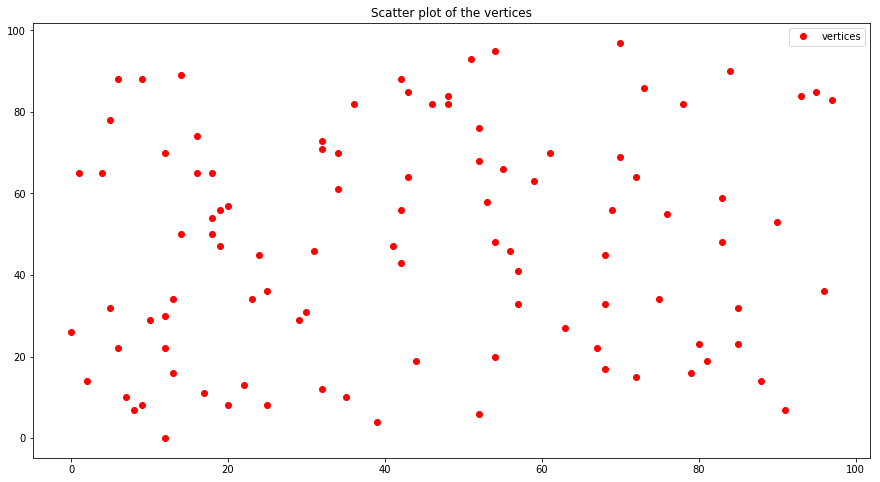

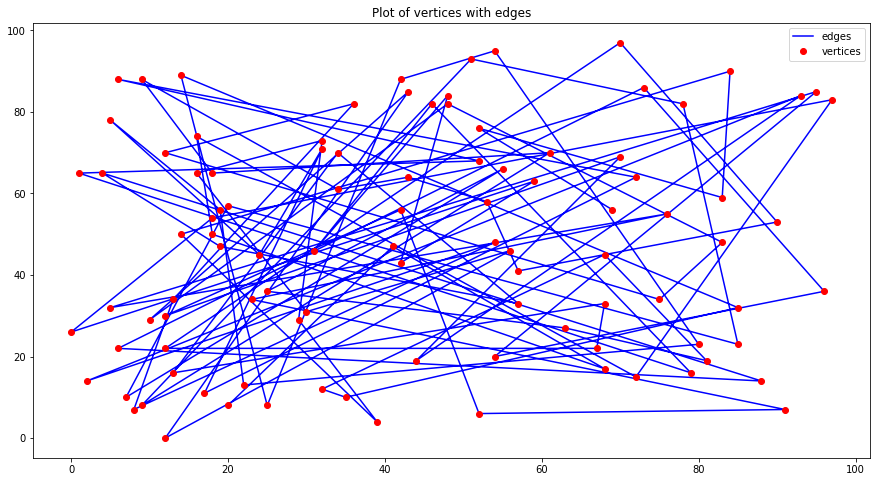

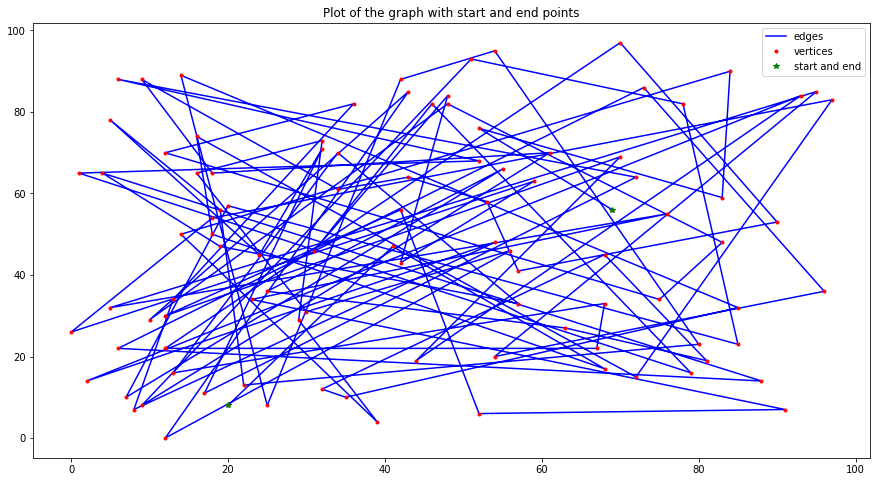

Start and end points are fixed at the first vertex and the last vertex
Start point:  20 8  - index:  0
End point:  69 56  - index:  99


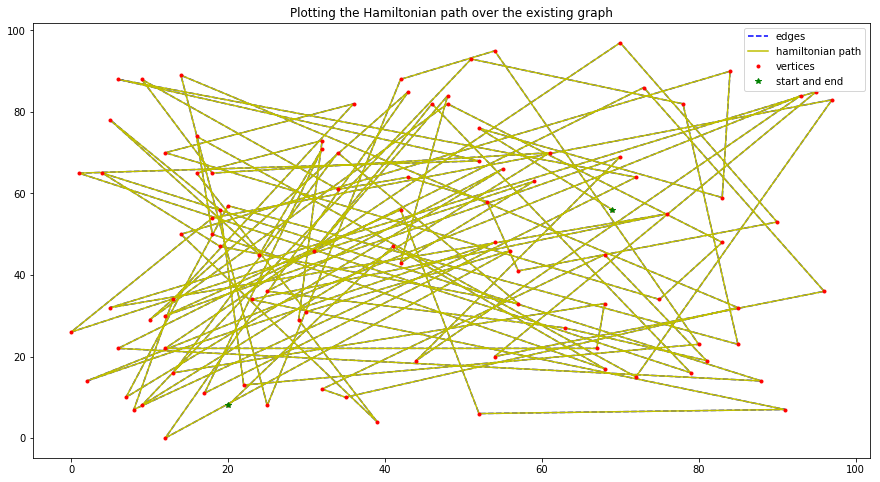


REPORT:
Tools: Jupyter Notebook
Language: Python 3.6
Packages: Numpy and Matplotlib
Complexity: O(1*n), since there are n vertices with maximum degree of 1
Unidirectional graph containing 100 vertices, 99 edges, each vertix having one degree
Possible Improvements: 
**adding edge connections to each vertex
**using dictionaries, lists, trees and other data structures


In [2]:
# graph that contains a hamiltonian path with respect to fixed start and end points
# False is used to denote that the 'designated' start and end vertices are fixed
path1 = undir_1degree(False)
path1.run_all()

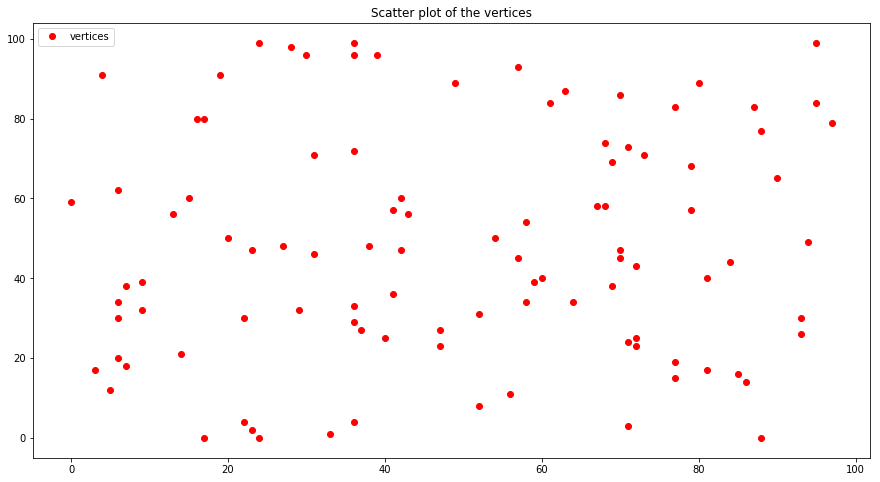

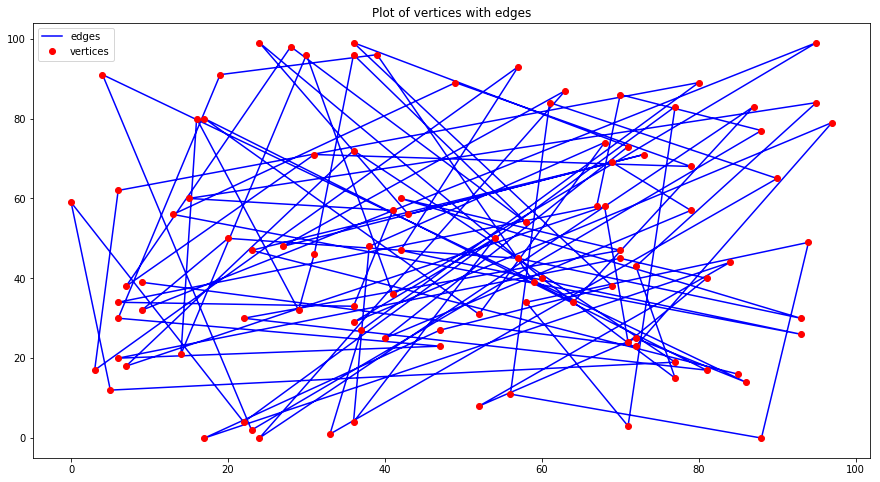

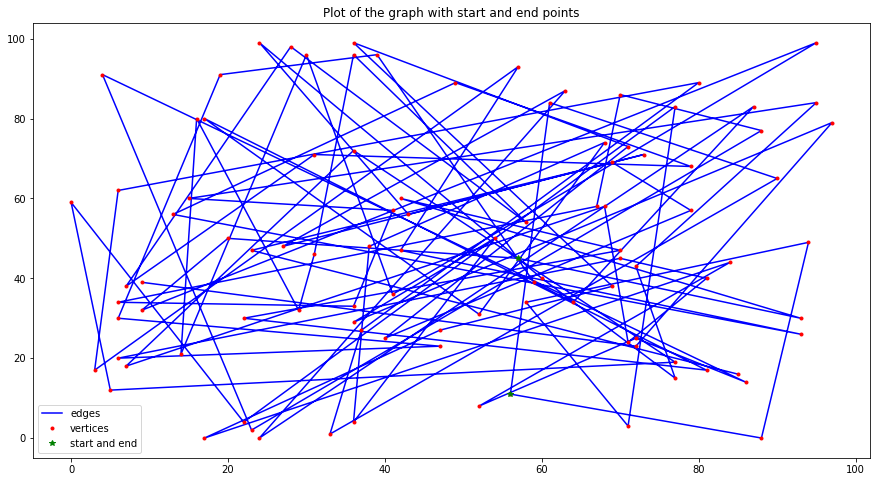

Start and end points are randomised
Start point:  56 11  - index:  56
End point:  57 45  - index:  84


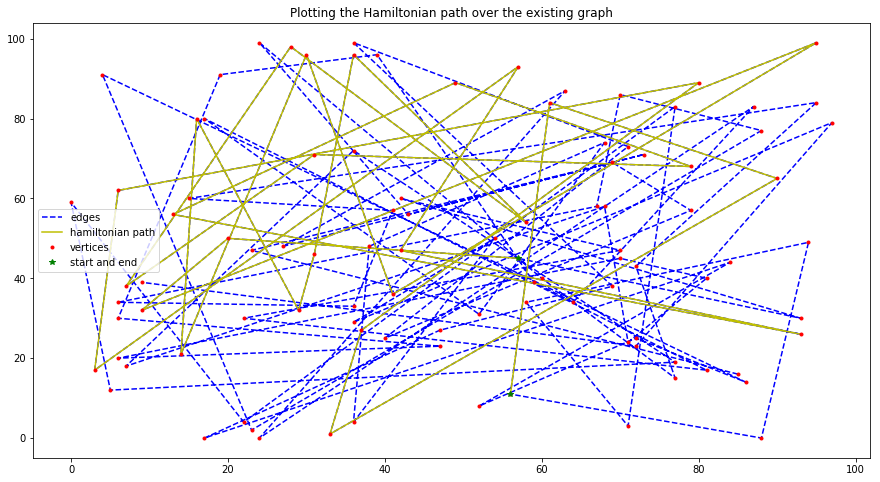


REPORT:
Tools: Jupyter Notebook
Language: Python 3.6
Packages: Numpy and Matplotlib
Complexity: O(1*n), since there are n vertices with maximum degree of 1
Unidirectional graph containing 100 vertices, 99 edges, each vertix having one degree
Possible Improvements: 
**adding edge connections to each vertex
**using dictionaries, lists, trees and other data structures


In [3]:
# graph that shows a hamiltonian path does not exist when random points are chosen
# True is used to denote that the 'designated' start and end vertices are selected from the graph at random
path2 = undir_1degree(True)
path2.run_all()

In [ ]:
'''
POSSIBLE ERRORS AND INADEQUACIES - Basic Undirected 1 degree Graph

*no naming convention for each vertex making it very straightforward to tally edges
*very mimimal number of edges leads to straight forward search
*very minimal number of edges limits possibilities of finding a hamiltonian path
*random start end fails to reach hamiltonian path beacuse of minimal number of edges
*no function to define how to create edges
*no function to set degree of each vertex
*no algorithm is defined to perform 'efficient' hamiltonian path search
*code is not automated to search for hamilton paths
*code is not made for directional graph
*differentiate between best, average and worst complexity
'''

# Experiment 2: Undirected 1 Degree Graph with Names

In [21]:
class undir_pnames(object):
    
    # making the required initialisations
    def __init__(self, loc):
        # x and y coordinates of all the vertices
        self.x = np.random.choice(100, 100)
        self.y = np.random.choice(100, 100)
        
        # naming each vertex to be used for annotation
        self.pnames = dict()
        
        # collecting the x and y coordinates
        self.xsteps = []
        self.ysteps = []
        
        # counting the number of steps
        self.count = 0
        # flag to decide if the start and end would be random points or the default first and last point
        self.rand = loc
        
        # setting up random start and end points
        if self.rand == True:
            self.r1 = np.random.randint(len(self.x))
            self.r2 = np.random.randint(len(self.x))
            
        else:
            self.r1 = 0
            self.r2 = self.x.shape[0] - 1
        
    
    # organize a naming dictionary for each point
    def set_names(self):
        for i in range(self.x.shape[0]):
            name = "p" + str(i)
            self.pnames[name] = i
    
    
    # function to repeat commonly required plots
    def plot_common(self):
        fig, ax = plt.subplots(figsize=(15,8))
        
        for i, k in enumerate(self.pnames.keys()):
            ax.annotate(k, (self.x[i], self.y[i]))
        
        return ax
    
    
    # scatter plot that contains all the vertices
    def plot_scatter(self):
        ax = self.plot_common()
        a1, = ax.plot(self.x, self.y, 'ro', label="vertices")
        plt.legend(handles=[a1])
        plt.title("Scatter plot of the vertices")
        plt.show()
        
        
    # plot containing all the vertices and edges
    def plot_lines(self):
        ax = self.plot_common()
        a1, = ax.plot(self.x, self.y, 'b-', label='edges')
        a2, = ax.plot(self.x, self.y, 'ro', label='vertices')
        plt.title("Plot of vertices with edges")
        plt.legend(handles=[a1, a2])
        plt.show()
        
        
    # plot containing all the vertices and edges, start and end points are specially marked
    def plot_AB(self):
        ax = self.plot_common()
        a1, = ax.plot(self.x, self.y, 'b-', label='edges')
        a2, = ax.plot(self.x, self.y, 'r.', label='vertices')
        a3, = ax.plot(self.x[self.r1], self.y[self.r1], 'g*', label='start and end')
        a4, = ax.plot(self.x[self.r2], self.y[self.r2], 'g*')
        plt.title("Plot of the graph with start and end points")
        plt.legend(handles=[a1, a2, a3, a4])
        plt.show()
        
    
    # function to find the path from start to finish (somewhat similar to one way dfs?)
    def path_collect(self, start, end):
        print("Start point: ", self.x[start], self.y[start], " - index: ", start)
        
        for i in range(start, len(self.x)):
            self.xsteps.append(self.x[i])
            self.ysteps.append(self.y[i])
            self.count += 1
            
            if i >= end:
                break
        
        print("End point: ", self.x[end], self.y[end], " - index: ", end)
    
    
    # function that finds the hamilton path between random start and end points
    def hamil_rand_path(self):
        
        # if the start point it lower than the end point
        if self.r1 < self.r2:
            self.path_collect(self.r1, self.r2)

        # if the start point is higher than the end point
        else:
            self.path_collect(self.r2, self.r1)
            
    
    # function that finds the path between the first point and the last point in a one directional graph
    def hamil_only_path(self):
        
        self.path_collect(self.r1, self.r2)
        
    
    # plotting the resultant hamiltonian path
    def plot_hamil(self):
        ax = self.plot_common()
        a1, = ax.plot(self.x, self.y, 'b--', label='edges')
        a2, = ax.plot(self.xsteps, self.ysteps, 'y-', label='hamiltonian path')
        a3, = ax.plot(self.x, self.y, 'r.', label='vertices')
        a4, = ax.plot(self.x[self.r1], self.y[self.r1], 'g*', label='start and end')
        plt.plot(self.x[self.r2], self.y[self.r2], 'g*')
        
        plt.title("Plotting the Hamiltonian path over the existing graph")
        plt.legend(handles=[a1, a2, a3, a4])
        plt.show()
        print(self.r1, self.r2)
        
    
    # brief description of current work
    def final_report(self):
        print("\nREPORT:")
        print("Tools: Jupyter Notebook")
        print("Language: Python 3.6")
        print("Packages: Numpy and Matplotlib")
        print("Complexity: O(1*n), since there are n vertices with maximum degree of 1")
        print("Unidirectional graph containing 100 vertices, 99 edges, each vertix having one degree")
        print("Possible Improvements: ")
        print("**adding edge connections to each vertex")
        print("**using dictionaries, lists, trees and other data structures")
        
    
    # function to run all the other functions
    def run_all(self):
        self.set_names()
        self.plot_scatter()
        self.plot_lines()
        self.plot_AB()
        
        # activating the random points function
        if self.rand == True:
            print("Start and end points are randomised")
            self.hamil_rand_path()
            
        # activating the fixed start and end function
        else:
            print("Start and end points are fixed at the first vertex and the last vertex")
            self.hamil_only_path()
            
        self.plot_hamil()
        self.final_report()

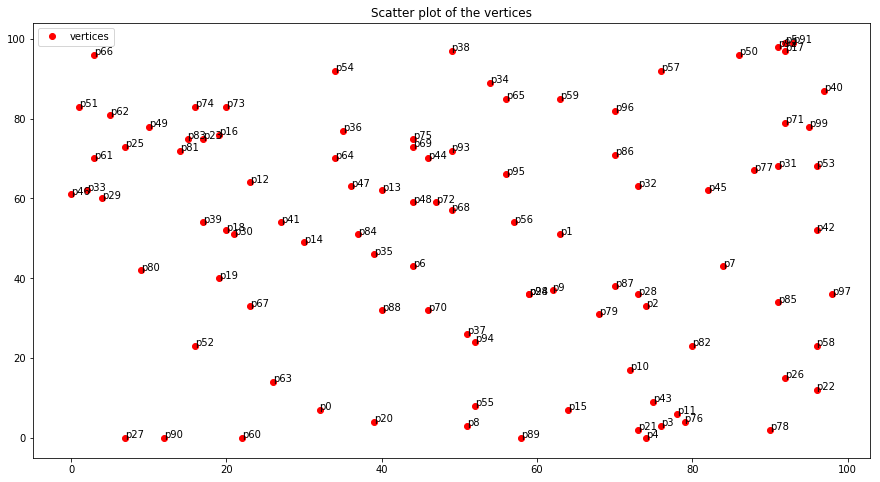

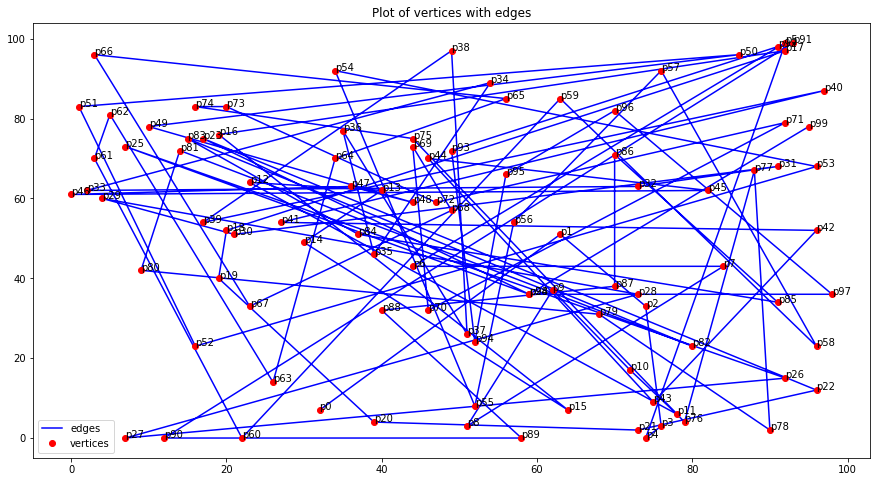

C:\Users\sunny\AppData\Roaming\Python\Python36\site-packages\matplotlib\legend.py:449: UserWarning: The handle <matplotlib.lines.Line2D object at 0x0000016123F58CF8> has a label of '_line3' which cannot be automatically added to the legend.
  'legend.'.format(handle, label))


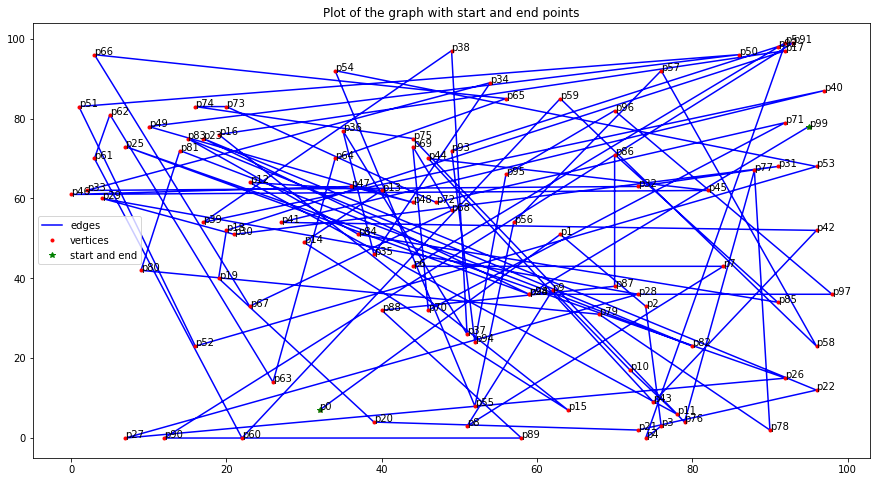

Start and end points are fixed at the first vertex and the last vertex
Start point:  32 7  - index:  0
End point:  95 78  - index:  99


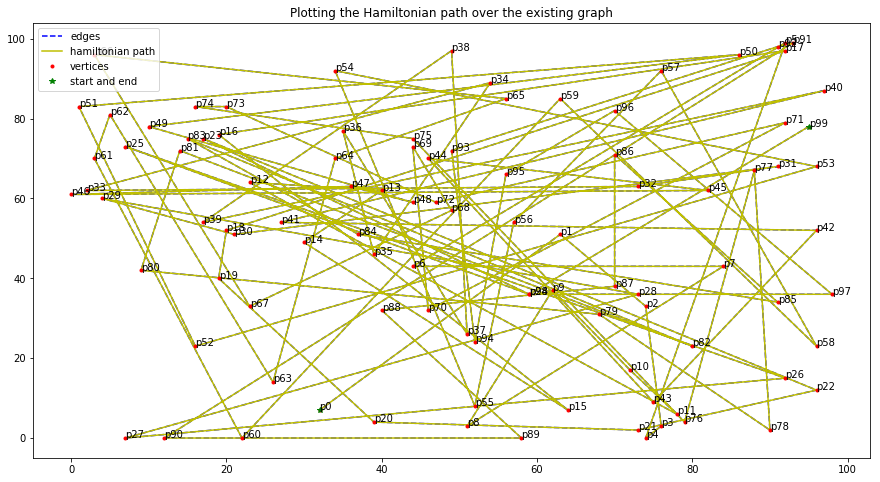

0 99

REPORT:
Tools: Jupyter Notebook
Language: Python 3.6
Packages: Numpy and Matplotlib
Complexity: O(1*n), since there are n vertices with maximum degree of 1
Unidirectional graph containing 100 vertices, 99 edges, each vertix having one degree
Possible Improvements: 
**adding edge connections to each vertex
**using dictionaries, lists, trees and other data structures


In [22]:
# graph that shows a hamiltonian path does exist when points are fixed also having vertex naming convention
# False is used to denote that the 'designated' start and end vertices are fixed
path3 = undir_pnames(loc=False)
path3.run_all()

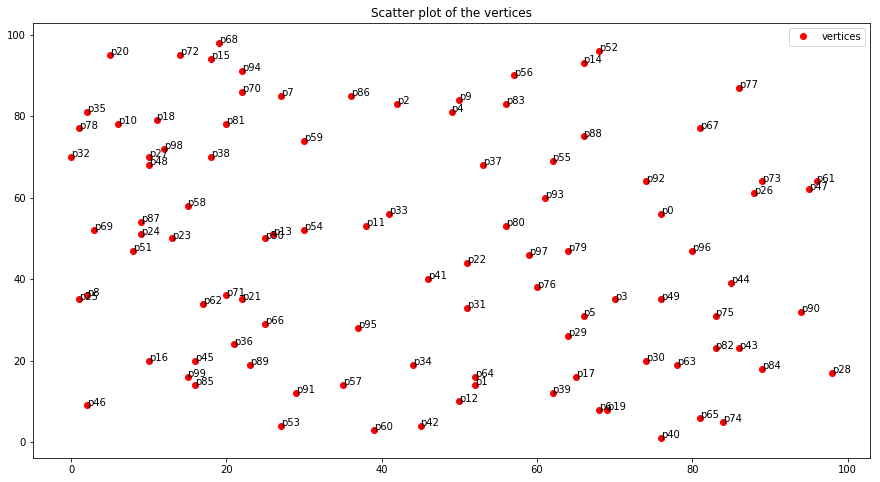

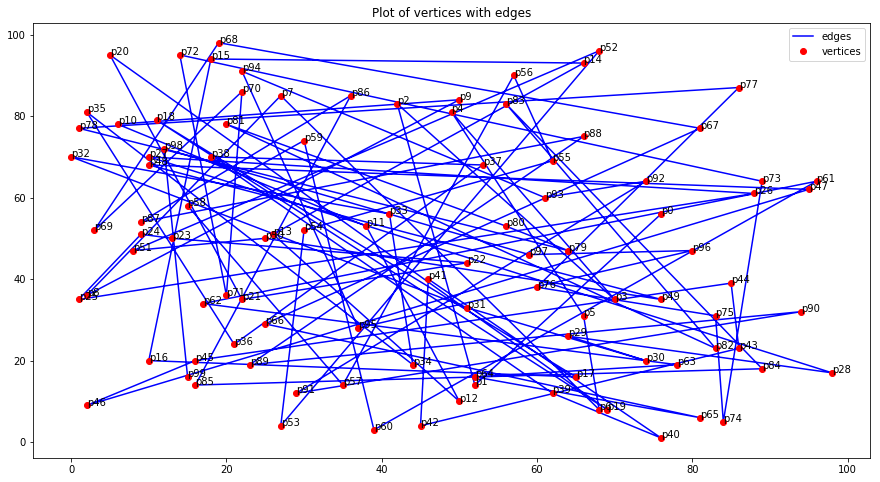

C:\Users\sunny\AppData\Roaming\Python\Python36\site-packages\matplotlib\legend.py:449: UserWarning: The handle <matplotlib.lines.Line2D object at 0x0000016123553BE0> has a label of '_line3' which cannot be automatically added to the legend.
  'legend.'.format(handle, label))


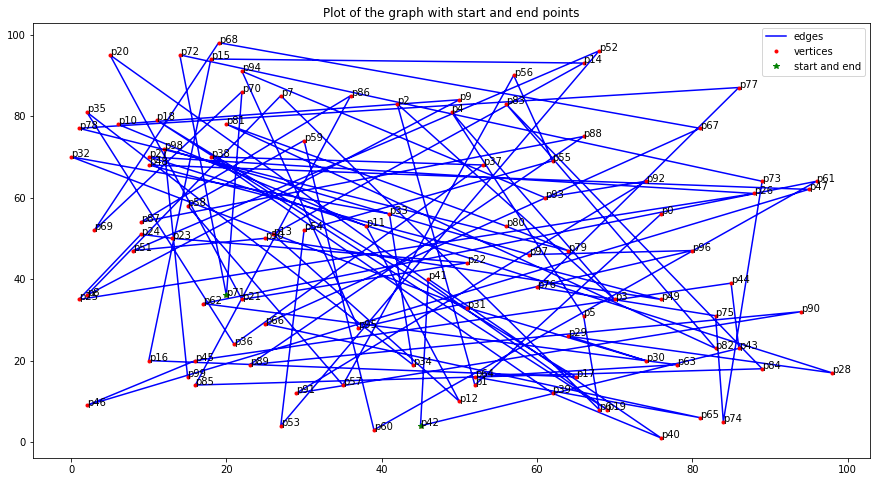

Start and end points are randomised
Start point:  45 4  - index:  42
End point:  20 36  - index:  71


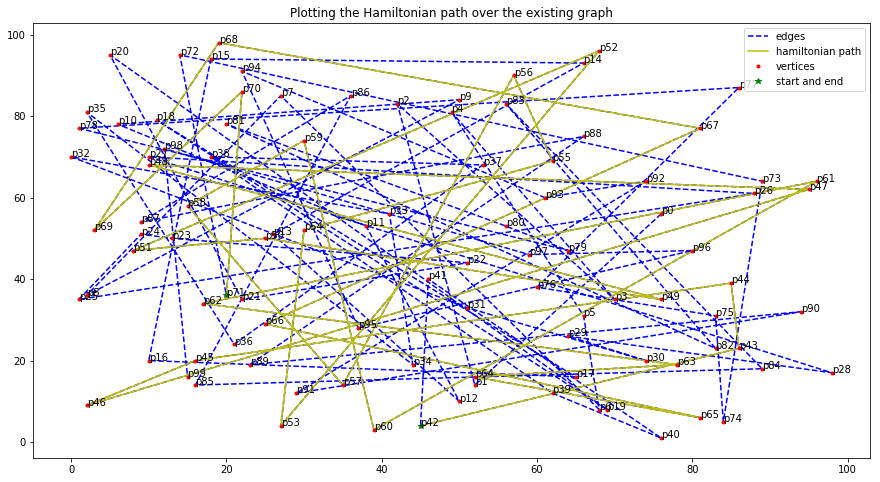

71 42

REPORT:
Tools: Jupyter Notebook
Language: Python 3.6
Packages: Numpy and Matplotlib
Complexity: O(1*n), since there are n vertices with maximum degree of 1
Unidirectional graph containing 100 vertices, 99 edges, each vertix having one degree
Possible Improvements: 
**adding edge connections to each vertex
**using dictionaries, lists, trees and other data structures


In [23]:
# graph that shows a hamiltonian path does not exist when random points are chosen also with naming convention
# True is used to denote that the 'designated' start and end vertices are selected from the graph at random
path4 = undir_pnames(loc=True)
path4.run_all()

In [ ]:
'''
POSSIBLE ERRORS AND INADEQUACIES - Undirected 1 Degree Graph with Names

*very mimimal number of edges leads to straight forward search
*very minimal number of edges limits possibilities of finding a hamiltonian path
*random start end fails to reach hamiltonian path beacuse of minimal number of edges
*no function to define how to create edges
*no function to set degree of each vertex
*no algorithm is defined to perform 'efficient' hamiltonian path search
*code is not automated to search for hamilton paths
*differentiate between best, average and worst complexity
'''

# Experiment 3: Undirected N Degree Graph Unfixed Degree

In [9]:
class undir_ndeg(object):
    
    # making the required initialisations
    def __init__(self, ndeg):
        # setting up the x and y coordinates of each vertex
        self.x = np.random.choice(100, 100)
        self.y = np.random.choice(100, 100)
        
        # selecting start and end points
        self.r1 = np.random.randint(len(self.x))
        self.r2 = np.random.randint(len(self.x))
        
        # setup the names of each point
        self.pnames = dict()
        # setup the edges and adjacent vertices
        self.edge_line = dict()
        # setup the edges and adjacent vertices with names
        self.edge_name = dict()
        # setup the degree of each vertex
        self.vert_degr = dict()
        
        # collect each step moving along the graph
        self.xsteps = []
        self.ysteps = []
        
        # counting the number of steps
        self.count = 0
        # setup the maximum degree
        self.ndeg = ndeg
        
    
    # organize a naming dictionary for each point
    def set_names(self):
        for i in range(self.x.shape[0]):
            name = "p" + str(i)
            self.pnames[name] = i
    
    
    # plotting the commonalities in each graph
    def plot_common(self):
        fig, ax = plt.subplots(figsize=(20,10))
        for i, k in enumerate(self.pnames.keys()):
            ax.annotate(k, (self.x[i], self.y[i]))
        
        return ax
    
    
    # scatter plot that contains all the vertices
    def plot_scatter(self):
        ax = self.plot_common()
        a1, = ax.plot(self.x, self.y, 'r.', label="vertices")
        plt.title("Scatter plot of the vertices")
        plt.legend(handles=[a1])
        plt.show()
        
    
    # function to set up the vertices and edges
    def build_graph(self):

        for i in self.pnames.keys():
            # avoiding vertices with degree less than 2
            num = np.random.randint(2, self.ndeg)
            edglis = []
            edgnam = []

            # setting point 1 of the edge
            p1 = (self.x[self.pnames[i]], self.y[self.pnames[i]])

            if num > (self.ndeg / 2):
                # lowering the probability of resulting in a high degree vertex
                num = np.random.randint(1, self.ndeg)

            for j in range(num):
                newpt = np.random.randint(100)
                
                # avoid selecting point 1 (creates an edge to itself)
                if self.pnames[i] == newpt:
                    continue

                else:
                    # setting the point 2 of the edge
                    p2 = (self.x[newpt], self.y[newpt])
                    line = p2

                    name2 = "p" + str(newpt)
                    edge = name2

                # add the 2nd point in both value and line
                edglis.append(line)
                edgnam.append(edge)

            # setup the edges of point 1
            self.edge_line[i] = edglis
            # setup the edge name of point 1
            self.edge_name[i] = edgnam
            # setup the degree of point 1
            self.vert_degr[i] = num
        
    
    # function to keep the graph consistent
    # ex: an edge to one vertex is also added to its adjacent vertex
    def maintain_graph(self):
        
        for i in self.edge_name.keys():
            # adding necessary edges
            for j in self.edge_name[i]:

                # adds the missing vertex name to the adjacent vertex list (edge list)
                lname = self.edge_name[j]
                if i not in lname:  
                    lname.append(i)
                    self.edge_name[j] = lname

                # adds the missing edge to the adjacent vertex list (edge name list)
                ledge = self.edge_line[j]
                if i not in ledge:
                    newv = (self.x[self.pnames[i]], self.y[self.pnames[i]])
                    ledge.append(newv)
                    self.edge_line[j] = ledge
                    # update the degree of the adjacent vertex
                    self.vert_degr[j] = self.vert_degr[j] + 1

    
    # plot the built and consistent graph
    def plot_graph(self):
        ax = self.plot_common()

        # plotting each edge from the edge list
        for i in list(self.pnames.keys()):

            for j in self.edge_name[i]:
                a1, = ax.plot((self.x[self.pnames[i]], self.x[self.pnames[j]]), 
                              (self.y[self.pnames[i]], self.y[self.pnames[j]]), 'y--', label='edges')

        # plotting vertices
        for i in list(self.edge_name.keys()):
            a2, = ax.plot(self.x[self.pnames[i]], self.y[self.pnames[i]], 'ro', label='vertices')

        # plotting the start and end vertex
        a3, = ax.plot(self.x[self.r1], self.y[self.r1], 'go', label='start and end')
        a4, = ax.plot(self.x[self.r2], self.y[self.r2], 'go')
        plt.legend(handles=[a1, a2, a3])
        
        
        print("Start point: ", self.x[self.r1], self.y[self.r1], " : p", self.r1)
        print("End point: ", self.x[self.r2], self.y[self.r2], " : p", self.r2)
        plt.title("Plotting the complete graph with start and end points")
        plt.show()
    
    
    # brief description of current work
    def final_report(self):
        print("\nREPORT:")
        print("Tools: Jupyter Notebook")
        print("Language: Python 3.6")
        print("Packages: Numpy and Matplotlib")
        print("Complexity: O(1*n), since there are n vertices with maximum degree greater than 1")
        print("Unidirectional graph containing 100 vertices, each with degree less than or equal to ", self.ndeg)
        print("Possible Improvements: ")
        print("**implement an efficient hamiltonian path algorithm")
        
    
    # function to run all the other functions
    def run_all(self):
        self.set_names()
        self.plot_scatter()
        self.build_graph()
        self.maintain_graph()
        self.plot_graph()
        self.final_report()

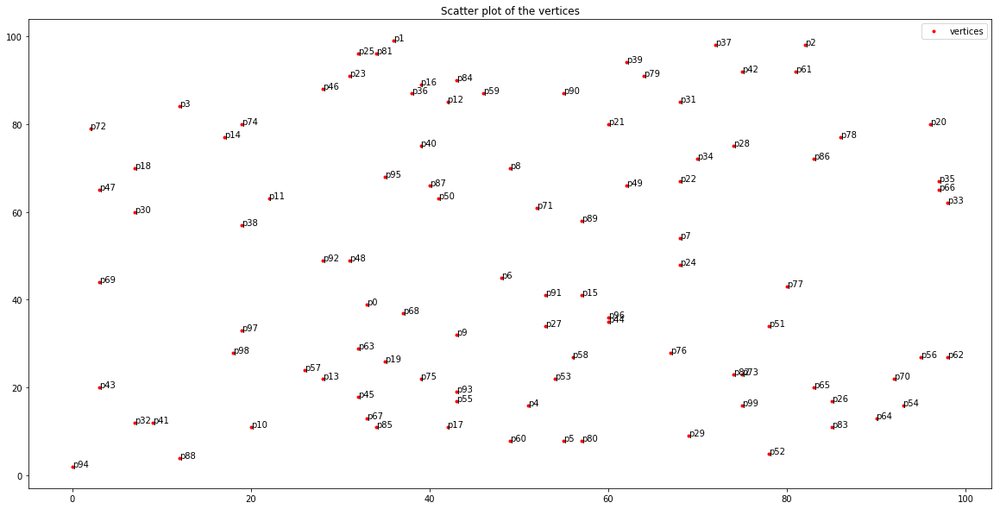

Start point:  7 12  : p 32
End point:  75 23  : p 73


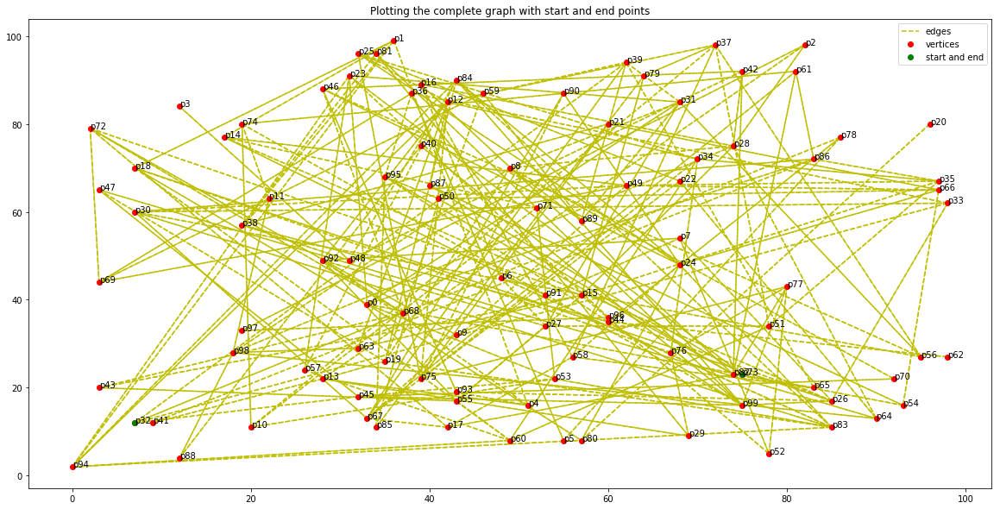


REPORT:
Tools: Jupyter Notebook
Language: Python 3.6
Packages: Numpy and Matplotlib
Complexity: O(1*n), since there are n vertices with maximum degree greater than 1
Unidirectional graph containing 100 vertices, each with degree less than or equal to  5
Possible Improvements: 
**implement an efficient hamiltonian path algorithm


In [10]:
# randomly built graph with 100 vertices with randomly set up degree of each vertex
# ndeg stands for the maximum degree of the required graph
path5 = undir_ndeg(ndeg=5)
path5.run_all()

In [ ]:
'''
POSSIBLE ERRORS AND INADEQUACIES - Unidirectional N Degree Graph Unfixed Degree

*hamiltonian path fails in presence of a vertex with degree=0
*hamiltonian path also fails in presence of vertex with degree=1 except if that vertex is the start or end
*does not adapt to graph having some vertices with degree less than 2
*no algorithm is defined to perform 'efficient' hamiltonian path search
*code is not automated to search for hamilton paths
*differentiate between best, average and worst complexity
'''

# Experiment 4: Undirected Graph Hamiltonian Path Algorithm

In [11]:
class undir_hamil(object):
    
    # making the required initialisations
    def __init__(self, ndeg, starter):
        # setting up the x and y coordinates of each vertex
        self.x = np.random.choice(100, 100)
        self.y = np.random.choice(100, 100)
        
        # selecting start and end points
        self.r1 = np.random.randint(len(self.x))
        self.r2 = np.random.randint(len(self.x))
        
        # setup the names of each point
        self.pnames = dict()
        # setup the edges and adjacent vertices
        self.edge_line = dict()
        # setup the edges and adjacent vertices with names
        self.edge_name = dict()
        # setup the degree of each vertex
        self.vert_degr = dict()
        
        # collect each step moving along the graph
        self.collect = []
        # setup the maximum degree
        self.ndeg = ndeg
        
        # resulting hamiltonian path
        self.xsteps = []
        self.ysteps = []
        
        # determining the search method with fixed search versus random search
        self.search_method = starter
        
    
    # organize a naming dictionary for each point
    def set_names(self):
        for i in range(self.x.shape[0]):
            name = "p" + str(i)
            self.pnames[name] = i
    
    
    # plotting the commonalities in each graph
    def plot_common(self):
        fig, ax = plt.subplots(figsize=(20,10))
        for i, k in enumerate(self.pnames.keys()):
            ax.annotate(k, (self.x[i], self.y[i]))
        
        return ax
    
    
    # scatter plot that contains all the vertices
    def plot_scatter(self):
        ax = self.plot_common()
        a1, = ax.plot(self.x, self.y, 'r.', label="vertices")
        plt.title("Scatter plot of the vertices")
        plt.legend(handles=[a1])
        plt.show()
        
    
    # function to set up the vertices and edges
    def build_graph(self):

        for i in self.pnames.keys():
            # avoiding vertices with degree less than 2
            num = np.random.randint(2, self.ndeg)
            edglis = []
            edgnam = []

            # setting point 1 of the edge
            p1 = (self.x[self.pnames[i]], self.y[self.pnames[i]])

            if num > (self.ndeg / 2):
                # lowering the probability of choosing a higher number
                num = np.random.randint(1, self.ndeg)

            for j in range(num):
                newpt = np.random.randint(100)
                
                # avoid selecting point 1 (creates an edge to itself)
                if self.pnames[i] == newpt:
                    continue

                else:
                    # setting the point 2 of the edge
                    p2 = (self.x[newpt], self.y[newpt])
                    line = p2

                    name2 = "p" + str(newpt)
                    edge = name2

                # add the 2nd point in both value and line
                edglis.append(line)
                edgnam.append(edge)

            # setup the edges of point 1
            self.edge_line[i] = edglis
            # setup the edge name of point 1
            self.edge_name[i] = edgnam
            # setup the degree of point 1
            self.vert_degr[i] = num
        
    
    # function to keep the graph consistent
    # ex: an edge to one vertex is also added to its adjacent vertex
    def maintain_graph(self):
        
        for i in self.edge_name.keys():
            # adding necessary edges
            for j in self.edge_name[i]:

                # adds the missing vertex name to the adjacent vertex list (edge list)
                lname = self.edge_name[j]
                if i not in lname:  
                    lname.append(i)
                    self.edge_name[j] = lname

                # adds the missing edge to the adjacent vertex list (edge name list)
                ledge = self.edge_line[j]
                if i not in ledge:
                    newv = (self.x[self.pnames[i]], self.y[self.pnames[i]])
                    ledge.append(newv)
                    self.edge_line[j] = ledge
                    # update the degree of the adjacent vertex
                    self.vert_degr[j] = len(ledge)

    
    # plot the built and consistent graph
    def plot_graph(self):
        ax = self.plot_common()

        # plotting each edge from the edge list
        for i in list(self.pnames.keys()):

            for j in self.edge_name[i]:
                a1, = ax.plot((self.x[self.pnames[i]], self.x[self.pnames[j]]), 
                              (self.y[self.pnames[i]], self.y[self.pnames[j]]), 'y-', label='edges')
        
        # plotting vertices
        for i in list(self.edge_name.keys()):
            a2, = ax.plot(self.x[self.pnames[i]], self.y[self.pnames[i]], 'ro', label='vertices')

        # plotting the start and end vertex
        a3, = ax.plot(self.x[self.r1], self.y[self.r1], 'go', label='start and end')
        a4, = ax.plot(self.x[self.r2], self.y[self.r2], 'go')
        plt.legend(handles=[a1, a2, a3])


        print("Start point: ", self.x[self.r1], self.y[self.r1], " : p", self.r1)
        print("End point: ", self.x[self.r2], self.y[self.r2], " : p", self.r2)
        plt.title("Plotting the complete graph with start and end points")
        plt.show()
            
            
    # collect the hamiltonian path with dfs followed by incremental bfs followed by dfs
    def hamil_dfsbfs_increment(self, vert):
        if len(self.collect) != len(self.x):
            self.collect.append(vert)

            for i in self.edge_name[vert]:
                if i not in self.collect:
                    self.hamil_dfsbfs_increment(i)
                    
                    
    # collect the hamiltonian path with dfs followed by randomized bfs followed by dfs
    def hamil_dfsbfs_random(self, vert):
        if len(self.collect) != len(self.x):
            self.collect.append(vert)
            lis = self.edge_name[vert]

            t = np.random.randint(len(lis))
            for i in range(t, len(lis)):
                if lis[i] not in self.collect:
                    self.hamil_dfsbfs_random(lis[i])
        
        
    # plot the resulting hamiltonian path
    def hamil_plot(self):
        ax = self.plot_common()
        
        # plotting each edge from the edge list
        for i in list(self.pnames.keys()):

            for j in self.edge_name[i]:
                a1, = ax.plot((self.x[self.pnames[i]], self.x[self.pnames[j]]), 
                              (self.y[self.pnames[i]], self.y[self.pnames[j]]), 'y-', label='Edges')
        
        
        # plotting the resulting hamiltonian path
        for i in self.collect:
            self.xsteps.append(self.x[self.pnames[i]])
            self.ysteps.append(self.y[self.pnames[i]])

        a2, = ax.plot(self.xsteps, self.ysteps, 'b--', label='Hamilton')
        
        
        # plotting vertices
        for i in list(self.edge_name.keys()):
            a3, = ax.plot(self.x[self.pnames[i]], self.y[self.pnames[i]], 'ro', label='Vertices')

        # plotting the start and end vertex
        a4, = ax.plot(self.x[self.r1], self.y[self.r1], 'go', label='Start & End')
        a5, = ax.plot(self.x[self.r2], self.y[self.r2], 'go')
        plt.legend(handles=[a1, a2, a3, a4])


        print("Start point: ", self.x[self.r1], self.y[self.r1], " : p", self.r1)
        print("End point: ", self.x[self.r2], self.y[self.r2], " : p", self.r2)
        plt.title("Plotting the hamiltonian path over the complete graph")
        plt.show()
        
    
    # brief description of current work
    def final_report(self):
        print("\nREPORT:")
        print("Tools: Jupyter Notebook")
        print("Language: Python 3.6")
        print("Packages: Numpy and Matplotlib")
        print("Complexity: O(1*n), since there are n vertices with maximum degree greater than 1")
        print("Unidirectional graph containing 100 vertices, each with degree less than or equal to ", self.ndeg)
        print("Possible Improvements: ")
        print("**implement an efficient hamiltonian path algorithm")
        
    
    # function to run all the other functions
    def run_all(self):
        self.set_names()
        self.plot_scatter()
        self.build_graph()
        self.maintain_graph()
        self.plot_graph()
        
        pt_name = "p" + str(self.r1)
        
        # implementing the fixed dfs - incremental bfs - dfs algorithm
        if self.search_method == True:
            self.hamil_dfsbfs_increment(pt_name)
            
        # implementing the fixed dfs - randomized bfs - dfs algorithm
        else:
            self.hamil_dfsbfs_random(pt_name)
            
        self.hamil_plot()
        self.final_report()

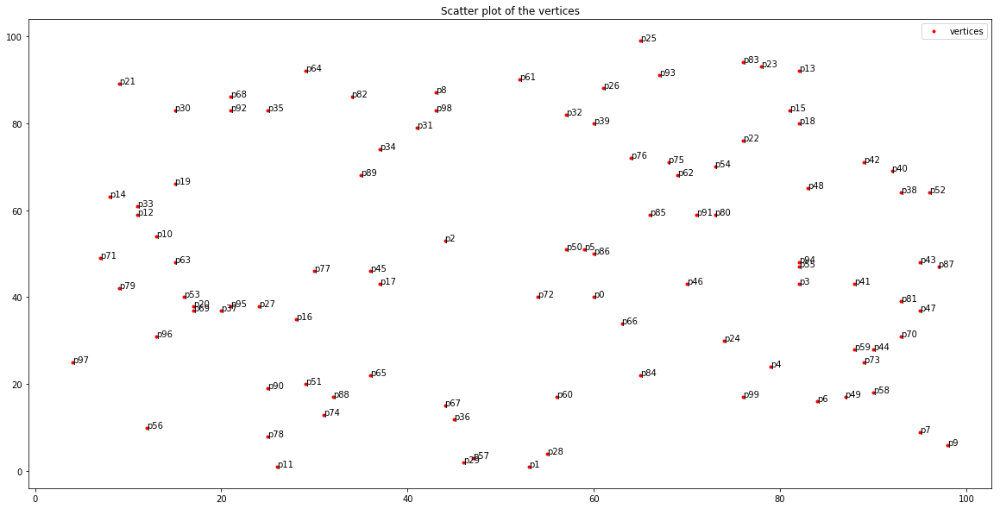

Start point:  95 9  : p 7
End point:  64 72  : p 76


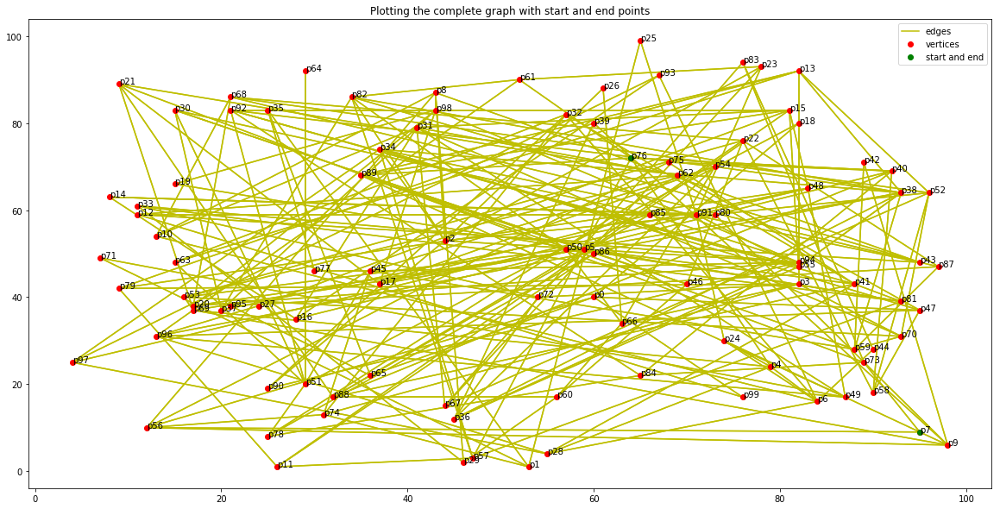

Start point:  95 9  : p 7
End point:  64 72  : p 76


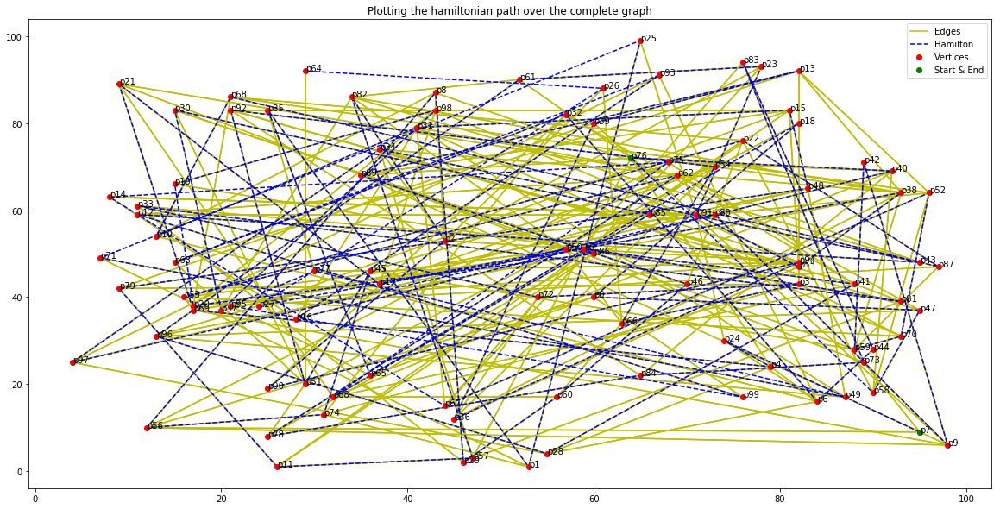


REPORT:
Tools: Jupyter Notebook
Language: Python 3.6
Packages: Numpy and Matplotlib
Complexity: O(1*n), since there are n vertices with maximum degree greater than 1
Unidirectional graph containing 100 vertices, each with degree less than or equal to  5
Possible Improvements: 
**implement an efficient hamiltonian path algorithm


In [12]:
# randomly built graph with 100 vertices with randomly set up degree of each vertex
# ndeg stands for the maximum degree of the required graph
# starter represents the algorithm that will be applied and True means that the DFS - increment BFS - DFS algorithm
path6 = undir_hamil(ndeg=5, starter=True)
path6.run_all()

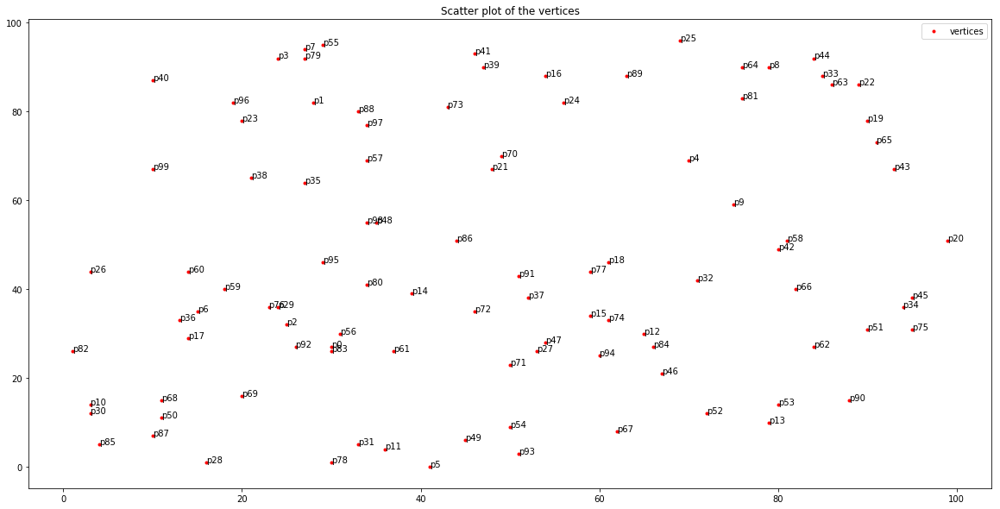

Start point:  14 29  : p 17
End point:  51 3  : p 93


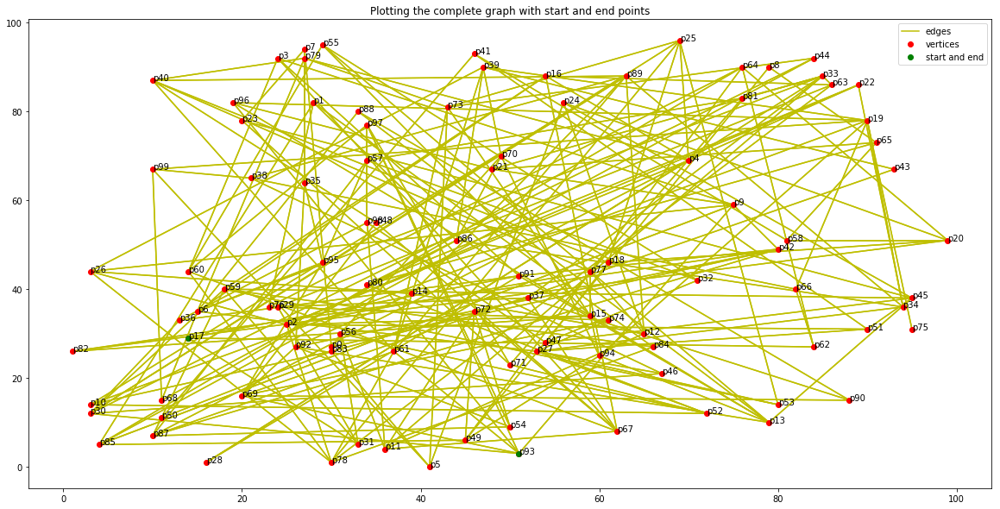

Start point:  14 29  : p 17
End point:  51 3  : p 93


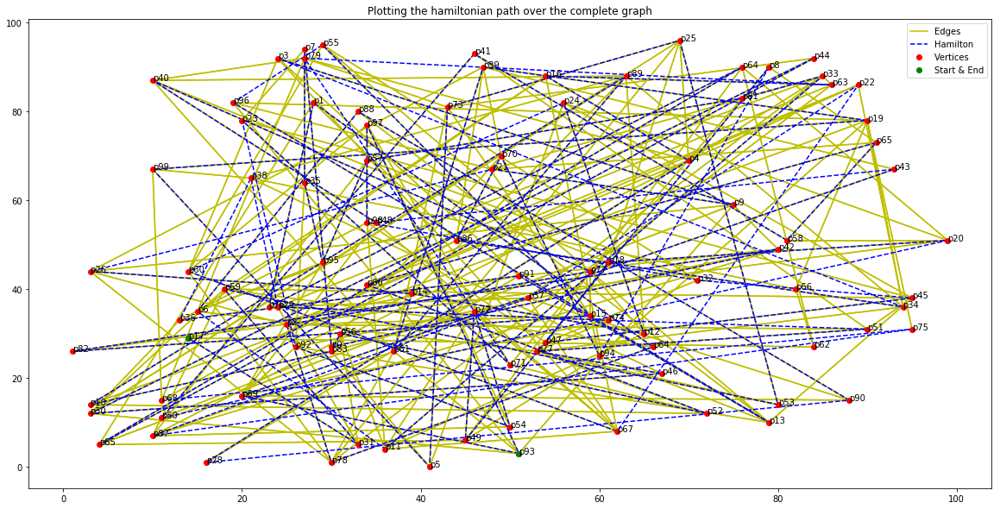


REPORT:
Tools: Jupyter Notebook
Language: Python 3.6
Packages: Numpy and Matplotlib
Complexity: O(1*n), since there are n vertices with maximum degree greater than 1
Unidirectional graph containing 100 vertices, each with degree less than or equal to  5
Possible Improvements: 
**implement an efficient hamiltonian path algorithm


In [13]:
# randomly built graph with 100 vertices with randomly set up degree of each vertex
# ndeg stands for the maximum degree of the required graph
# starter represents the algorithm that will be applied and False means that the DFS - randomized BFS - DFS algorithm
path7 = undir_hamil(ndeg=5, starter=False)
path7.run_all()

In [ ]:
'''
POSSIBLE ERRORS AND INADEQUACIES - Unidirectional Graph Hamiltonian Path Algorithm

*hamiltonian path fails in presence of a vertex with degree=0
*hamiltonian path also fails in presence of vertex with degree=1 except if that vertex is the start or end
*does not adapt to graph having some vertices with degree less than 2

*obtains hamilton path but fails to setup the end point as end of the path because backtracking is not applied in any way
*removal of edges can possibly affect the ability of the algorithm to find the hamilton path
*differentiate between best, average and worst complexity


*algorithm applied may or may not be efficient
** Algorithm 1: hamil_dfsbfs_increment-
Step 1: performs Depth First Search over the graph until a vertex gets repeated
Step 2: 'increments' the index of that vertex to another edge following a Breadth First Search approach to prevent overlap
Step 3: Repeats steps 1 and 2 until all vertices are collected without repetition

** Algorithm 2: hamil_dfsbfs_random-
Step 1: performs Depth First Search over the graph until a vertex gets repeated
Step 2: 'randomly' moves the index of that vertex to another edge following a Breadth First Search approach to prevent overlap
Step 3: Repeats steps 1 and 2 until all vertices are collected without repetition
'''

# Experiment 5: Undirected Graph Brute Force Randomized Hamilton

In [14]:
class undir_forced_random_hamil(object):
    
    # making the required initialisations
    def __init__(self, ndeg, cycles):
        # setting up the x and y coordinates of each vertex
        self.x = np.random.choice(100, 100)
        self.y = np.random.choice(100, 100)
        
        # selecting start and end points
        self.r1 = np.random.randint(len(self.x))
        self.r2 = np.random.randint(len(self.x))
        
        # setup the names of each point
        self.pnames = dict()
        # setup the edges and adjacent vertices
        self.edge_line = dict()
        # setup the edges and adjacent vertices with names
        self.edge_name = dict()
        # setup the degree of each vertex
        self.vert_degr = dict()
        
        # collect each step moving along the graph
        self.collect = []
        # setup the maximum degree
        self.ndeg = ndeg
        # repeating the randomized dfs bfs with as many cycles as required to get the final output
        self.cycles = cycles
        
        # resulting hamiltonian path
        self.xsteps = []
        self.ysteps = []
        
        # setting up a dictionary to store all hamiltonian paths
        self.hamilton = dict()
        
    
    # organize a naming dictionary for each point
    def set_names(self):
        for i in range(self.x.shape[0]):
            name = "p" + str(i)
            self.pnames[name] = i
    
    
    # plotting the commonalities in each graph
    def plot_common(self):
        fig, ax = plt.subplots(figsize=(20,10))
        for i, k in enumerate(self.pnames.keys()):
            ax.annotate(k, (self.x[i], self.y[i]))
        
        return ax
    
    
    # scatter plot that contains all the vertices
    def plot_scatter(self):
        ax = self.plot_common()
        a1, = ax.plot(self.x, self.y, 'r.', label="vertices")
        plt.title("Scatter plot of the vertices")
        plt.legend(handles=[a1])
        plt.show()
        
    
    # function to set up the vertices and edges
    def build_graph(self):

        for i in self.pnames.keys():
            # avoiding vertices with degree less than 2
            num = np.random.randint(2, self.ndeg)
            edglis = []
            edgnam = []

            # setting point 1 of the edge
            p1 = (self.x[self.pnames[i]], self.y[self.pnames[i]])

            if num > (self.ndeg / 2):
                # lowering the probability of choosing a higher number
                num = np.random.randint(1, self.ndeg)

            for j in range(num):
                newpt = np.random.randint(100)
                
                # avoid selecting point 1 (creates an edge to itself)
                if self.pnames[i] == newpt:
                    continue

                else:
                    # setting the point 2 of the edge
                    p2 = (self.x[newpt], self.y[newpt])
                    line = p2

                    name2 = "p" + str(newpt)
                    edge = name2

                # add the 2nd point in both value and line
                edglis.append(line)
                edgnam.append(edge)

            # setup the edges of point 1
            self.edge_line[i] = edglis
            # setup the edge name of point 1
            self.edge_name[i] = edgnam
            # setup the degree of point 1
            self.vert_degr[i] = num
        
    
    # function to keep the graph consistent
    # ex: an edge to one vertex is also added to its adjacent vertex
    def maintain_graph(self):
        
        for i in self.edge_name.keys():
            # adding necessary edges
            for j in self.edge_name[i]:

                # adds the missing vertex name to the adjacent vertex list (edge list)
                lname = self.edge_name[j]
                if i not in lname:  
                    lname.append(i)
                    self.edge_name[j] = lname

                # adds the missing edge to the adjacent vertex list (edge name list)
                ledge = self.edge_line[j]
                if i not in ledge:
                    newv = (self.x[self.pnames[i]], self.y[self.pnames[i]])
                    ledge.append(newv)
                    self.edge_line[j] = ledge
                    # update the degree of the adjacent vertex
                    self.vert_degr[j] = len(ledge)

    
    # plot the built and consistent graph
    def plot_graph(self):
        ax = self.plot_common()

        # plotting each edge from the edge list
        for i in list(self.pnames.keys()):

            for j in self.edge_name[i]:
                a1, = ax.plot((self.x[self.pnames[i]], self.x[self.pnames[j]]), 
                              (self.y[self.pnames[i]], self.y[self.pnames[j]]), 'y-', label='edges')
        
        # plotting vertices
        for i in list(self.edge_name.keys()):
            a2, = ax.plot(self.x[self.pnames[i]], self.y[self.pnames[i]], 'ro', label='vertices')

        # plotting the start and end vertex
        a3, = ax.plot(self.x[self.r1], self.y[self.r1], 'go', label='start and end')
        a4, = ax.plot(self.x[self.r2], self.y[self.r2], 'go')
        plt.legend(handles=[a1, a2, a3])

        plt.title("Plotting the complete graph with start and end points")
        plt.show()
                    
                    
    # collect the hamiltonian path with dfs followed by randomized bfs followed by dfs
    def randomized_dfsbfs(self, vert):
        if len(self.collect) != len(self.x):
            self.collect.append(vert)
            lis = self.edge_name[vert]

            t = np.random.randint(len(lis))
            for i in range(t, len(lis)):
                if lis[i] not in self.collect:
                    self.randomized_dfsbfs(lis[i])
                    
                    
    # brute forcing the hamilton path using the randomized dfs bfs over the incremental dfs bfs
    def bruteforce_randomized_dfsbfs(self):
        # iterator over the number of cycles
        ptr = 0
        # flag to indicate if a hamiltonian path is found or not
        flag = 1
        
        st_name = "p" + str(self.r1) 
        ed_name = "p" + str(self.r2)
        
        while ptr < self.cycles:
            self.collect = [] 
            #print("At cycle: ", ptr)
            # repeating the algorithm as many times as required
            self.randomized_dfsbfs(st_name)
            
            # found the hamilton path and test if its a new path not found yet
            if (self.collect[len(self.collect)-1] == ed_name) and (len(self.collect) == 100):
                flag = 0
                
                print("We won!")
                print("What did it cost?")
                print("Brute Force Randomized search requiring ", ptr + 1, " cycles...")
                newadd = "cycle_" + str(ptr + 1)
                self.hamilton[newadd] = self.collect
                
                '''
                # my attempt at writing code to test the uniqueness of each obtained hamiltonian path
                # flag that differentiates between a new path or an already found path
                diff = 0
                # algorithm to test if path is new or an already found path
                for p in self.hamilton.keys():
                    count = 0
                    stored = self.hamilton[p]
                    
                    for i in range(len(stored)):
                        # comparing paths
                        if stored[i] != self.collect[i]:
                            count = count + 1
                            
                    
                    # a new path is found
                    if count > 0:
                        diff = 1
                        continue
                    
                    # path is already stored
                    else:
                        diff = 0
                        break
                    
                if diff == 1:
                    newadd = "cycle_" + str(ptr + 1)
                    self.hamilton[newadd] = self.collect'''
                    
            ptr = ptr + 1
                
        if flag == 1:
            print("Failed to find Hamiltonian path!")
            print("1. Please increase the maximum degree of the graph or")
            print("2. Please increase the number of search cycles to repeat the algorithm")            
        
        
    # plot the resulting hamiltonian path
    def hamil_plot(self):
        
        for key in self.hamilton.keys():
            
            cur_path = self.hamilton[key]
            idx1, idx2 = self.pnames[cur_path[0]], self.pnames[cur_path[-1]]
            
            print("\n\nHamilton Path found at: ", key)
            print("Hamilton Path begins at vertex: ", cur_path[0], " coords are: ", self.x[idx1], self.y[idx1])
            print("Hamilton Path ends at vertex: ", cur_path[-1], " coords are: ", self.x[idx2], self.y[idx2])
            ax = self.plot_common()

            # plotting each edge from the edge list
            for i in list(self.pnames.keys()):

                for j in self.edge_name[i]:
                    a1, = ax.plot((self.x[self.pnames[i]], self.x[self.pnames[j]]), 
                                  (self.y[self.pnames[i]], self.y[self.pnames[j]]), 'y-', label='Edges')


            # plotting the resulting hamiltonian path
            for pt in cur_path:
                self.xsteps.append(self.x[self.pnames[pt]])
                self.ysteps.append(self.y[self.pnames[pt]])

            a2, = ax.plot(self.xsteps, self.ysteps, 'b--', label='Hamilton')


            # plotting vertices
            for i in list(self.edge_name.keys()):
                a3, = ax.plot(self.x[self.pnames[i]], self.y[self.pnames[i]], 'ro', label='Vertices')

            # plotting the start and end vertex
            a4, = ax.plot(self.x[idx1], self.y[idx1], 'go', label='Start & End')
            a5, = ax.plot(self.x[idx2], self.y[idx2], 'go')
            plt.legend(handles=[a1, a2, a3, a4])
            
            full_title = "Plotting the Hamiltonian Path over the Complete Graph obtained from: " + key
            plt.title(full_title)
            
            # reset each path steps
            self.xsteps = []
            self.ysteps = []
            plt.show()
        
    
    # brief description of current work
    def final_report(self):
        print("\nREPORT:")
        print("Tools: Jupyter Notebook")
        print("Language: Python 3.6")
        print("Packages: Numpy and Matplotlib")
        print("Complexity: O(1*n), since there are n vertices with maximum degree greater than 1")
        print("Unidirectional graph containing 100 vertices, each with degree less than or equal to ", self.ndeg)
        print("Possible Improvements: ")
        print("**different algorithms could improve efficiency")
        print("**increasing scalibility will reduce efficiency")
        print("**code is not prepared to work with directional graphs")
        
    
    # function to run all the other functions
    def run_all(self):
        self.set_names()
        self.plot_scatter()
        self.build_graph()
        self.maintain_graph()
        self.plot_graph()
        
        # implementing the brute force randomized dfs bfs algorithm
        self.bruteforce_randomized_dfsbfs()
            
        self.hamil_plot()
        self.final_report()

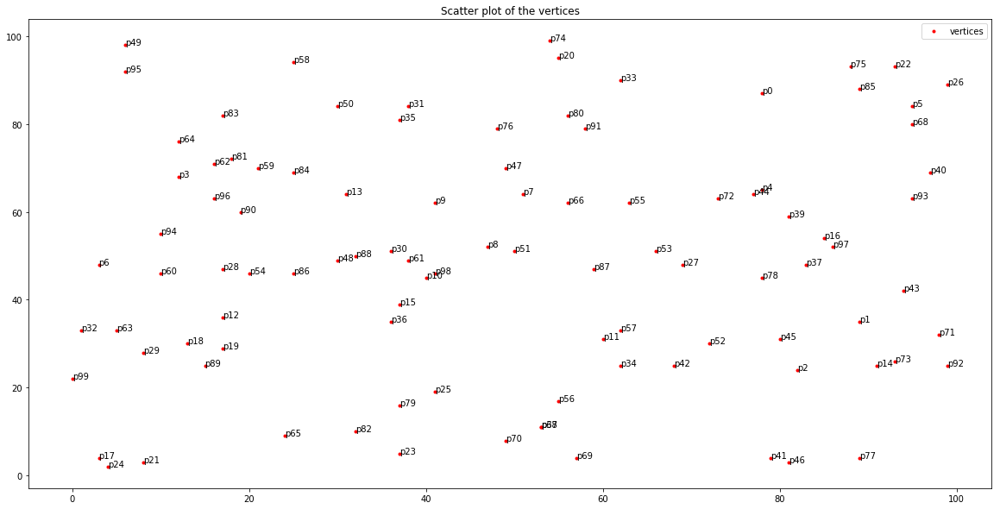

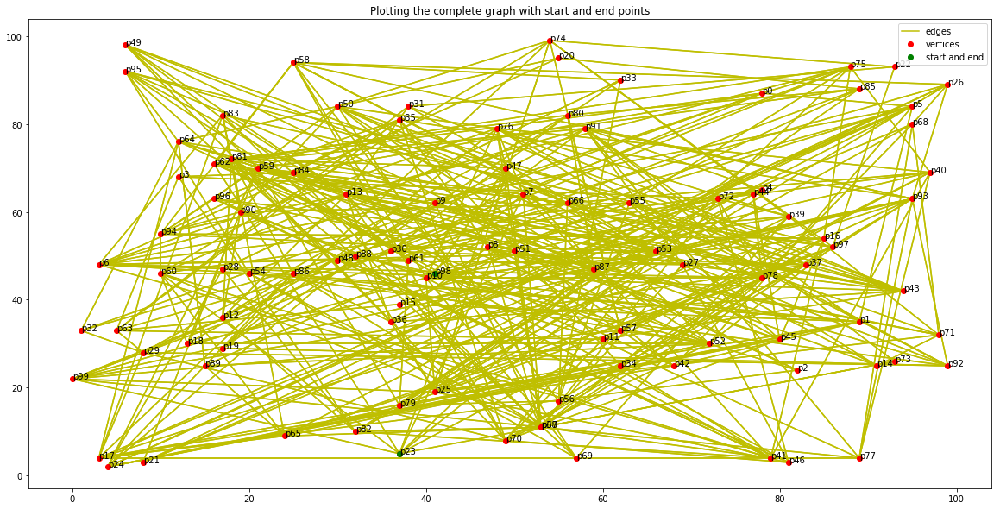

We won!
What did it cost?
Brute Force Randomized search requiring  253  cycles...
We won!
What did it cost?
Brute Force Randomized search requiring  1661  cycles...
We won!
What did it cost?
Brute Force Randomized search requiring  9209  cycles...


Hamilton Path found at:  cycle_253
Hamilton Path begins at vertex:  p98  coords are:  41 46
Hamilton Path ends at vertex:  p23  coords are:  37 5


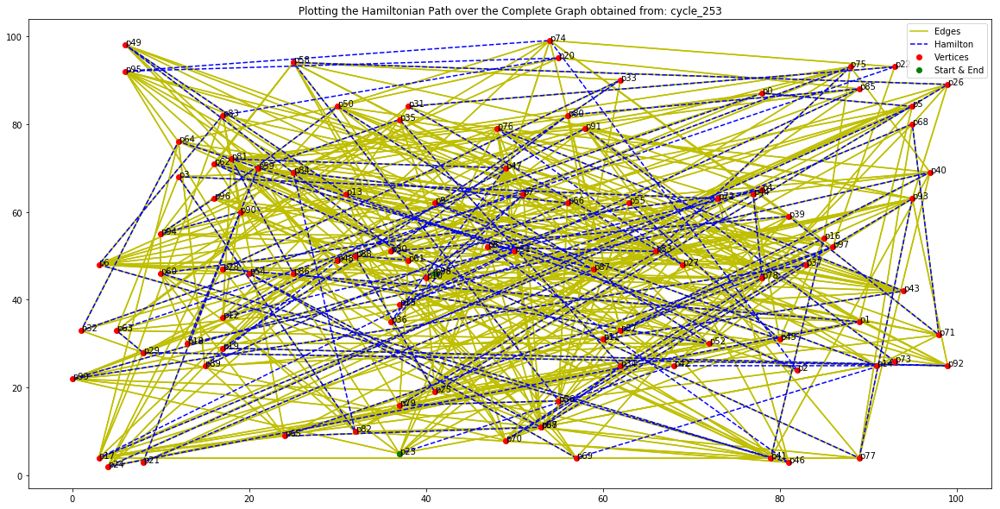



Hamilton Path found at:  cycle_1661
Hamilton Path begins at vertex:  p98  coords are:  41 46
Hamilton Path ends at vertex:  p23  coords are:  37 5


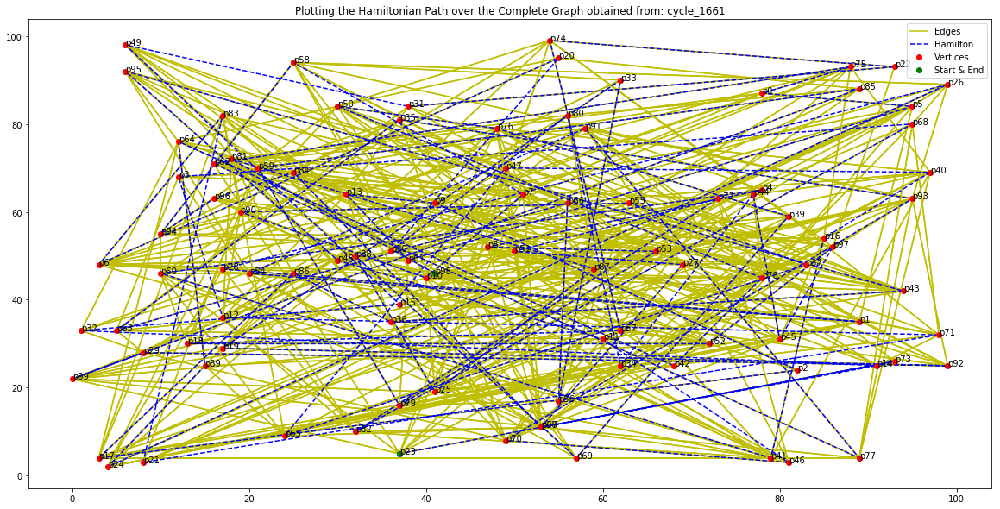



Hamilton Path found at:  cycle_9209
Hamilton Path begins at vertex:  p98  coords are:  41 46
Hamilton Path ends at vertex:  p23  coords are:  37 5


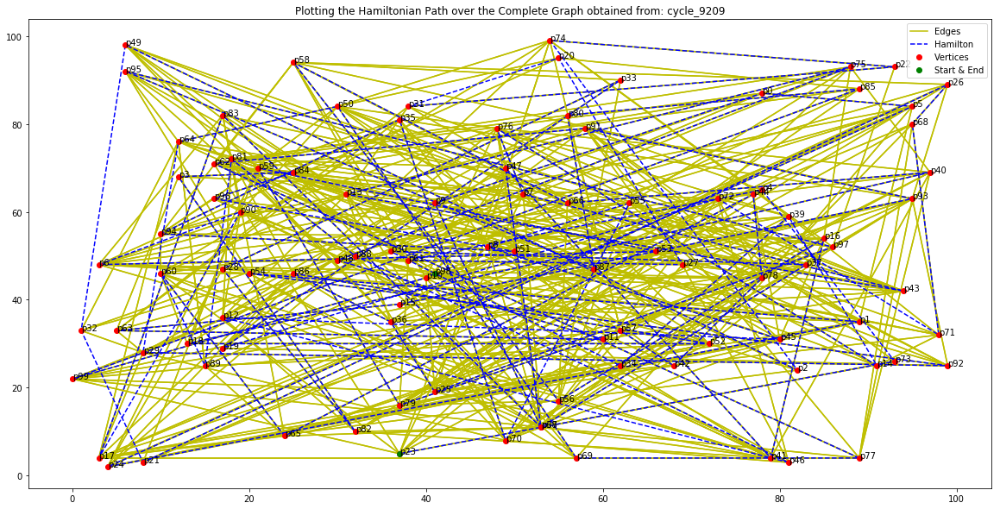


REPORT:
Tools: Jupyter Notebook
Language: Python 3.6
Packages: Numpy and Matplotlib
Complexity: O(1*n), since there are n vertices with maximum degree greater than 1
Unidirectional graph containing 100 vertices, each with degree less than or equal to  10
Possible Improvements: 
**different algorithms could improve efficiency
**increasing scalibility will reduce efficiency
**code is not prepared to work with directional graphs


In [15]:
# randomly built graph with 100 vertices with randomly set up degree of each vertex
# ndeg stands for the maximum degree of the required graph
# cycles represents the number of times the algorithm will need to be repeated to attain the complete hamiltonian path
# the more the number of cycles, the higher the possibility of finding more hamilton paths keeping start and end vertices same
path8 = undir_forced_random_hamil(ndeg=10, cycles=10000)
path8.run_all()

In [18]:
# to observe the hamiltonian paths obtained thus far--
for k in path8.hamilton.keys():
    print("Cycle: ", k)
    print("Path: ", path8.hamilton[k])
    print("Length of Path: ", len(path8.hamilton[k]))
    print("\n\n")

Cycle:  cycle_253
Path:  ['p98', 'p55', 'p45', 'p13', 'p49', 'p61', 'p88', 'p25', 'p26', 'p58', 'p56', 'p79', 'p44', 'p78', 'p70', 'p93', 'p77', 'p62', 'p87', 'p21', 'p90', 'p94', 'p96', 'p50', 'p52', 'p86', 'p81', 'p47', 'p36', 'p7', 'p10', 'p99', 'p37', 'p67', 'p65', 'p97', 'p57', 'p40', 'p18', 'p59', 'p35', 'p34', 'p38', 'p54', 'p69', 'p73', 'p91', 'p12', 'p4', 'p60', 'p41', 'p16', 'p11', 'p43', 'p76', 'p27', 'p31', 'p22', 'p63', 'p29', 'p92', 'p19', 'p33', 'p28', 'p1', 'p24', 'p5', 'p0', 'p32', 'p64', 'p51', 'p17', 'p68', 'p71', 'p39', 'p30', 'p80', 'p85', 'p15', 'p72', 'p3', 'p82', 'p84', 'p66', 'p89', 'p48', 'p75', 'p53', 'p8', 'p46', 'p6', 'p83', 'p20', 'p95', 'p74', 'p2', 'p9', 'p14', 'p42', 'p23']
Length of Path:  100



Cycle:  cycle_1661
Path:  ['p98', 'p81', 'p87', 'p25', 'p88', 'p69', 'p39', 'p76', 'p50', 'p78', 'p42', 'p64', 'p89', 'p24', 'p26', 'p28', 'p1', 'p54', 'p91', 'p77', 'p62', 'p75', 'p0', 'p5', 'p61', 'p13', 'p9', 'p2', 'p17', 'p86', 'p36', 'p43', 'p95', 'p48', 

In [ ]:
'''
POSSIBLE ERRORS AND INADEQUACIES - Unidirectional Graph Brute Force Randomized Hamilton

** does not adapt to graph having some vertices with degree less than 2
** removal of edges can possibly affect the ability of the algorithm to find the hamilton path
** differentiate between best, average and worst complexity
** algorithm applied may or may not be efficient because of it dependency on random functions
** given enough cycles, all hamiltonian paths can be found with the above algorithm

** Algorithm: bruteforce_randomized_dfsbfs:
Step 1: Performs Depth First Search over the graph until a vertex gets repeated
Step 2: 'Randomly' moves the index of that vertex to another edge following a Breadth First Search approach to prevent overlap
Step 3: Repeats steps 1 and 2 until all vertices are collected without repetition
Step 4: Collects the path iff it strictly adheres to the following two conditions:
        1. Follows Hamiltonian Path rule (each vertex reached only once)
        2. Only paths that end with the "designated" end point are collected
Step 5: Repeat steps 1 to 4 for as many cycles as required to collect as many hamiltonian paths between fixed start and ends
'''